In [ ]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
# install dependencies: (use cu111 because colab has CUDA 11.1)
!pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html

# install mmcv-full thus we could use CUDA operators
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html

# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

!pip install -e .


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |█████████████                   | 834.1 MB 2.2 MB/s eta 0:09:01tcmalloc: large alloc 1147494400 bytes == 0x39c80000 @  0x7fbbd691e615 0x592b76 0x4df71e 0x59afff 0x515655 0x549576 0x593fce 0x548ae9 0x51566f 0x549576 0x593fce 0x548ae9 0x5127f1 0x598e3b 0x511f68 0x598e3b 0x511f68 0x598e3b 0x511f68 0x4bc98a 0x532e76 0x594b72 0x515600 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576 0x593fce 0x5118f8 0x593dd7
     |████████████████▌               | 1055.7 MB 1.3 MB/s eta 0:12:33tcmalloc: large alloc 1434370048 bytes == 0x7e2d6000 @  0x7fbbd691e615 0x592b76 0x4df71e 0x59afff 0x515655 0x549576 0x593fce 0x548ae9 0x51566f 0x549576 0x593fce 0x548ae9 0x5127f1 0x598e3b 0x511f68 0x598e3b 0x511f68 0x598e3b 0x511f68 0x4bc98a 0x532e76 0x594b72 0x515600 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576 0x593fce 0x5118f8 0x593dd7
     |█████

In [ ]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print(mmdet.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())

1.9.0+cu111 False
No CUDA runtime is found, using CUDA_HOME='/usr/local/cuda'
2.24.1
11.1
GCC 7.3


In [ ]:
# We download the pre-trained checkpoints for inference and finetuning.
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth \
      -O checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth

!wget -c https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_c4_1x_coco/faster_rcnn_r50_caffe_c4_1x_coco_20220316_150152-3f885b85.pth \
      -O checkpoints/faster_rcnn_r50_caffe_c4_1x_coco_20220316_150152-3f885b85.pth

#ssd mobelent
!wget -c https://download.openmmlab.com/mmdetection/v2.0/ssd/ssdlite_mobilenetv2_scratch_600e_coco/ssdlite_mobilenetv2_scratch_600e_coco_20210629_110627-974d9307.pth \
      -O checkpoints/ssdlite_mobilenetv2_scratch_600e_coco_20210629_110627-974d9307.pth

# ssd vgg
!wget -c https://download.openmmlab.com/mmdetection/v2.0/ssd/ssd512_coco/ssd512_coco_20210803_022849-0a47a1ca.pth \
      -O checkpoints/ssd512_coco_20210803_022849-0a47a1ca.pth


--2022-05-24 08:43:23--  https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.75.20.18
Connecting to download.openmmlab.com (download.openmmlab.com)|47.75.20.18|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 167291982 (160M) [application/octet-stream]
Saving to: ‘checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth’

checkpoints/faster_ 100%[===================>] 159.54M  9.82MB/s    in 18s     

2022-05-24 08:43:42 (8.68 MB/s) - ‘checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth’ saved [167291982/167291982]

--2022-05-24 08:43:42--  https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_c4_1x_coco/faster_rcnn_r50_caffe_c4_1x_coco_20220316_150152-3f885b85.pth
Resolving download.openmmlab.co

In [ ]:
!ls checkpoints

faster_rcnn_r50_caffe_c4_1x_coco_20220316_150152-3f885b85.pth
faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth
ssd512_coco_20210803_022849-0a47a1ca.pth
ssdlite_mobilenetv2_scratch_600e_coco_20210629_110627-974d9307.pth


In [ ]:
!ls -la checkpoints

total 453472
drwxr-xr-x  2 root root      4096 May 24 08:43 .
drwxr-xr-x 17 root root      4096 May 24 08:43 ..
-rw-r--r--  1 root root 135664585 Mar 23 08:45 faster_rcnn_r50_caffe_c4_1x_coco_20220316_150152-3f885b85.pth
-rw-r--r--  1 root root 167291982 Nov  2  2021 faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth
-rw-r--r--  1 root root 144175983 Nov  2  2021 ssd512_coco_20210803_022849-0a47a1ca.pth
-rw-r--r--  1 root root  17203719 Nov  2  2021 ssdlite_mobilenetv2_scratch_600e_coco_20210629_110627-974d9307.pth


In [ ]:
# download, decompress the data
!wget https://download.openmmlab.com/mmdetection/data/kitti_tiny.zip
!unzip kitti_tiny.zip > /dev/null

--2022-05-24 08:44:56--  https://download.openmmlab.com/mmdetection/data/kitti_tiny.zip
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.28
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.28|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6918271 (6.6M) [application/zip]
Saving to: ‘kitti_tiny.zip’

kitti_tiny.zip      100%[===================>]   6.60M  4.19MB/s    in 1.6s    

2022-05-24 08:44:59 (4.19 MB/s) - ‘kitti_tiny.zip’ saved [6918271/6918271]



In [ ]:
!apt-get -q install tree
!tree kitti_tiny

Reading package lists...
Building dependency tree...
Reading state information...
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 42 not upgraded.
Need to get 40.7 kB of archives.
After this operation, 105 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tree amd64 1.7.0-5 [40.7 kB]
Fetched 40.7 kB in 1s (74.6 kB/s)
Selecting previously unselected package tree.
(Reading database ... 155629 files and directories currently installed.)
Preparing to unpack .../tree_1.7.0-5_amd64.deb ...
Unpacking tree (1.7.0-5) ...
Setting up tree (1.7.0-5) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
kitti_tiny
├── training
│   ├── image_2
│   │   ├── 000000.jpeg
│   │   ├── 000001.jpeg
│   │   ├── 000002.jpeg
│   │   ├── 000003.jpeg
│   │   ├── 000004.jpe

In [ ]:
import mmcv
import matplotlib.pyplot as plt
from mmdet.apis import inference_detector, init_detector, show_result_pyplot


In [ ]:
config = 'configs/ssd/ssd512_coco.py'
# Setup a checkpoint file to load
checkpoint = 'checkpoints/ssd512_coco_20210803_022849-0a47a1ca.pth'
# initialize the detector
model = init_detector(config, checkpoint, device='cuda:0' )
# Use the detector to do inference
img = mmcv.imread('kitti_tiny/training/image_2/000000.jpeg')
result = inference_detector(model, img)
result

In [ ]:
show_result_pyplot(model, img, result, score_thr=0.0)
show_result_pyplot(model, img, result, score_thr=0.3)

In [ ]:

img = mmcv.imread('kitti_tiny/training/image_2/000012.jpeg')
result = inference_detector(model, img)
result

In [ ]:
show_result_pyplot(model, img, result, score_thr=0.0)
show_result_pyplot(model, img, result, score_thr=0.3)

In [ ]:
import copy
import os.path as osp

import mmcv
import numpy as np

from mmdet.datasets.builder import DATASETS
from mmdet.datasets.custom import CustomDataset

@DATASETS.register_module()
class KittiTinyDataset(CustomDataset):

    CLASSES = ('Car', 'Pedestrian', 'Cyclist', 'Truck')

    def load_annotations(self, ann_file):
        cat2label = {k: i for i, k in enumerate(self.CLASSES)}
        # load image list from file
        image_list = mmcv.list_from_file(self.ann_file)
    
        data_infos = []
        # convert annotations to middle format
        for image_id in image_list:
            #filename = f'{self.img_prefix}/{image_id}.png'
            filename = f'{self.img_prefix}/{image_id}.jpeg'
            
            image = mmcv.imread(filename)
            height, width = image.shape[:2]
    
            #data_info = dict(filename=f'{image_id}.png', width=width, height=height)
            data_info = dict(filename=f'{image_id}.jpeg', width=width, height=height)
            # load annotations
            label_prefix = self.img_prefix.replace('image_2', 'label_2')
            lines = mmcv.list_from_file(osp.join(label_prefix, f'{image_id}.txt'))
    
            content = [line.strip().split(' ') for line in lines]
            bbox_names = [x[0] for x in content]
            bboxes = [[float(info) for info in x[4:8]] for x in content]
    
            gt_bboxes = []
            gt_labels = []
            gt_bboxes_ignore = []
            gt_labels_ignore = []
    
            # filter 'DontCare'
            for bbox_name, bbox in zip(bbox_names, bboxes):
                if bbox_name in cat2label:
                    gt_labels.append(cat2label[bbox_name])
                    gt_bboxes.append(bbox)
                else:
                    gt_labels_ignore.append(-1)
                    gt_bboxes_ignore.append(bbox)

            data_anno = dict(
                bboxes=np.array(gt_bboxes, dtype=np.float32).reshape(-1, 4),
                labels=np.array(gt_labels, dtype=np.long),
                bboxes_ignore=np.array(gt_bboxes_ignore,
                                       dtype=np.float32).reshape(-1, 4),
                labels_ignore=np.array(gt_labels_ignore, dtype=np.long))

            data_info.update(ann=data_anno)
            data_infos.append(data_info)

        return data_infos

In [ ]:
import mmcv
from mmcv.runner import load_checkpoint
from mmcv import Config

model_type = "ssd_512"

if model_type == "faster_rcnn_1":
  cfg = mmcv.Config.fromfile('./configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco.py') 
  cfg.device = "cuda" if torch.cuda.is_available() else "cpu"                      
elif model_type == "faster_rcnn_2":
  cfg = mmcv.Config.fromfile('./configs/faster_rcnn/faster_rcnn_r50_caffe_c4_1x_coco.py')
  cfg.device = "cuda" if torch.cuda.is_available() else "cpu"
elif model_type == "ssd_mobilenet":
  cfg = mmcv.Config.fromfile('./configs/ssd/ssdlite_mobilenetv2_scratch_600e_coco.py')
  cfg.device = "cuda" if torch.cuda.is_available() else "cpu"

elif model_type == "ssd_512":
  cfg = mmcv.Config.fromfile('./configs/ssd/ssd512_coco.py')
  cfg.device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
from mmdet.apis import set_random_seed

# Modify dataset type and path
cfg.dataset_type = 'KittiTinyDataset'
cfg.data_root = 'kitti_tiny/'

cfg.data.test.type = 'KittiTinyDataset'
cfg.data.test.data_root = 'kitti_tiny/' 
cfg.data.test.ann_file = 'train.txt'
cfg.data.test.img_prefix = 'training/image_2' 


if model_type == "ssd_mobilenet":
  cfg.data.train.dataset.type = 'KittiTinyDataset'
  cfg.data.train.dataset.data_root = 'kitti_tiny/'
  cfg.data.train.dataset.ann_file = 'train.txt'
  cfg.data.train.dataset.img_prefix = 'training/image_2'
elif model_type == "faster_rcnn_1":
  cfg.data.train.dataset.type = 'KittiTinyDataset'
  cfg.data.train.dataset.data_root = 'kitti_tiny/'
  cfg.data.train.dataset.ann_file = 'train.txt'
  cfg.data.train.dataset.img_prefix = 'training/image_2'
elif model_type == "faster_rcnn_2":
  cfg.data.train.type = 'KittiTinyDataset'
  cfg.data.train.data_root = 'kitti_tiny/'
  cfg.data.train.ann_file = 'train.txt'
  cfg.data.train.img_prefix = 'training/image_2'
elif model_type == "ssd_512":
  cfg.data.train.dataset.type = 'KittiTinyDataset'
  cfg.data.train.dataset.data_root = 'kitti_tiny/'
  cfg.data.train.dataset.ann_file = 'train.txt'
  cfg.data.train.dataset.img_prefix = 'training/image_2'

cfg.data.val.type = 'KittiTinyDataset'
cfg.data.val.data_root = 'kitti_tiny/'
cfg.data.val.ann_file = 'val.txt'
cfg.data.val.img_prefix = 'training/image_2'


if model_type == "ssd_mobilenet":
  cfg.model.bbox_head.num_classes = 4
  cfg.load_from = 'checkpoints/ssdlite_mobilenetv2_scratch_600e_coco_20210629_110627-974d9307.pth'
elif model_type == "faster_rcnn_1":
  cfg.model.roi_head.bbox_head.num_classes = 4
  cfg.load_from = 'checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'
elif model_type == "faster_rcnn_2":
  cfg.model.roi_head.bbox_head.num_classes = 4
  cfg.load_from = 'checkpoints/faster_rcnn_r50_caffe_c4_1x_coco_20220316_150152-3f885b85.pth'
elif model_type == "ssd_512":
  cfg.model.bbox_head.num_classes = 4
  cfg.load_from = 'checkpoints/ssd512_coco_20210803_022849-0a47a1ca.pth'

# Set up working dir to save files and logs. куда сохранять
cfg.work_dir = './tutorial_exps'

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.



cfg.optimizer.lr = 3e-3 #0.02 / 8 
#cfg.lr_config.warmup = None
cfg.lr_config.warmup_ratio = 1.0 / 1e10
cfg.log_config.interval = 10


# Change the evaluation metric since we use customized dataset.
cfg.evaluation.metric = 'mAP'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 12
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 12

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')




Config:
input_size = 512
model = dict(
    type='SingleStageDetector',
    backbone=dict(
        type='SSDVGG',
        depth=16,
        with_last_pool=False,
        ceil_mode=True,
        out_indices=(3, 4),
        out_feature_indices=(22, 34),
        init_cfg=dict(
            type='Pretrained', checkpoint='open-mmlab://vgg16_caffe')),
    neck=dict(
        type='SSDNeck',
        in_channels=(512, 1024),
        out_channels=(512, 1024, 512, 256, 256, 256, 256),
        level_strides=(2, 2, 2, 2, 1),
        level_paddings=(1, 1, 1, 1, 1),
        l2_norm_scale=20,
        last_kernel_size=4),
    bbox_head=dict(
        type='SSDHead',
        in_channels=(512, 1024, 512, 256, 256, 256, 256),
        num_classes=4,
        anchor_generator=dict(
            type='SSDAnchorGenerator',
            scale_major=False,
            input_size=512,
            basesize_ratio_range=(0.1, 0.9),
            strides=[8, 16, 32, 64, 128, 256, 512],
            ratios=[[2], [2, 3], [2, 3

In [ ]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector

In [ ]:
datasets = [build_dataset(cfg.data.train)]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int` for which `np.compat.long` is itself an alias. Doing this will not modify any behaviour and is safe. When replacing `np.long`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:58: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int`

In [ ]:
model = build_detector(cfg.model)
model

SingleStageDetector(
  (backbone): SSDVGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=Tr

In [ ]:
model.CLASSES = datasets[0].CLASSES
model.CLASSES

('Car', 'Pedestrian', 'Cyclist', 'Truck')

**Faster-rcnn fpn**

In [ ]:
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

2022-05-23 22:35:46,372 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int` for which `np.compat.long` is itself an alias. Doing this will not modify any behaviour and is safe. When replacing `np.long`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:58: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by i

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 25/25, 9.8 task/s, elapsed: 3s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-05-23 22:41:40,083 - mmdet - INFO - 
+------------+-----+------+--------+-------+
| class      | gts | dets | recall | ap    |
+------------+-----+------+--------+-------+
| Car        | 62  | 95   | 0.919  | 0.820 |
| Pedestrian | 13  | 30   | 0.846  | 0.717 |
| Cyclist    | 7   | 15   | 0.571  | 0.176 |
| Truck      | 3   | 11   | 1.000  | 1.000 |
+------------+-----+------+--------+-------+
| mAP        |     |      |        | 0.678 |
+------------+-----+------+--------+-------+
2022-05-23 22:41:40,086 - mmdet - INFO - Epoch(val) [12][25]	AP50: 0.6780, mAP: 0.6782


In [ ]:
imgs = [
  'kitti_tiny/001000.png','kitti_tiny/001001.png','kitti_tiny/001002.png','kitti_tiny/001003.png','kitti_tiny/001004.png',
  'kitti_tiny/001005.png','kitti_tiny/001006.png','kitti_tiny/001007.png','kitti_tiny/001008.png','kitti_tiny/001009.png',
  'kitti_tiny/001010.png','kitti_tiny/001011.png','kitti_tiny/001012.png','kitti_tiny/001013.png','kitti_tiny/001014.png',
  'kitti_tiny/001015.png','kitti_tiny/001016.png','kitti_tiny/001017.png','kitti_tiny/001018.png','kitti_tiny/001019.png',
  'kitti_tiny/001020.png','kitti_tiny/001021.png','kitti_tiny/001022.png','kitti_tiny/001023.png','kitti_tiny/001024.png',
  'kitti_tiny/001025.png','kitti_tiny/001026.png','kitti_tiny/001027.png','kitti_tiny/001028.png','kitti_tiny/001029.png',
  'kitti_tiny/001030.png','kitti_tiny/001031.png','kitti_tiny/001032.png','kitti_tiny/001033.png','kitti_tiny/001034.png',
  'kitti_tiny/001035.png','kitti_tiny/001036.png','kitti_tiny/001037.png','kitti_tiny/001038.png','kitti_tiny/001039.png',
  'kitti_tiny/001040.png','kitti_tiny/001041.png','kitti_tiny/001042.png','kitti_tiny/001043.png','kitti_tiny/001044.png',
  'kitti_tiny/001045.png','kitti_tiny/001046.png','kitti_tiny/001047.png','kitti_tiny/001048.png','kitti_tiny/001049.png',
  'kitti_tiny/001050.png','kitti_tiny/001051.png','kitti_tiny/001052.png','kitti_tiny/001053.png','kitti_tiny/001054.png',
  'kitti_tiny/001055.png','kitti_tiny/001056.png','kitti_tiny/001057.png','kitti_tiny/001058.png','kitti_tiny/001059.png',
  'kitti_tiny/001060.png','kitti_tiny/001061.png','kitti_tiny/001062.png','kitti_tiny/001063.png','kitti_tiny/001064.png',
  'kitti_tiny/001065.png','kitti_tiny/001066.png','kitti_tiny/001067.png','kitti_tiny/001068.png','kitti_tiny/001069.png',
  'kitti_tiny/001070.png','kitti_tiny/001071.png','kitti_tiny/001072.png','kitti_tiny/001073.png','kitti_tiny/001074.png',
  'kitti_tiny/001075.png','kitti_tiny/001076.png','kitti_tiny/001077.png','kitti_tiny/001078.png','kitti_tiny/001079.png',
  'kitti_tiny/001080.png','kitti_tiny/001081.png','kitti_tiny/001082.png','kitti_tiny/001083.png','kitti_tiny/001084.png',
  'kitti_tiny/001085.png','kitti_tiny/001086.png','kitti_tiny/001087.png','kitti_tiny/001088.png','kitti_tiny/001089.png',
  'kitti_tiny/001090.png','kitti_tiny/001091.png','kitti_tiny/001092.png','kitti_tiny/001093.png','kitti_tiny/001094.png',
  'kitti_tiny/001095.png','kitti_tiny/001096.png','kitti_tiny/001097.png','kitti_tiny/001098.png','kitti_tiny/001099.png',
  'kitti_tiny/001100.png'
  ]

In [ ]:
import time
immg = []
[immg.append(mmcv.imread(img)) for img in imgs]

model.cfg = cfg

all_times = []
for x in immg:
  start_time = time.time()
  result = (inference_detector(model, x))
  result_time = (time.time() - start_time)
  all_times.append(result_time)

print(all_times)

[0.14219188690185547, 0.12792634963989258, 0.1062173843383789, 0.09161591529846191, 0.09604740142822266, 0.09423112869262695, 0.09591078758239746, 0.09204959869384766, 0.09460592269897461, 0.09204840660095215, 0.09364938735961914, 0.09308862686157227, 0.09506654739379883, 0.09351253509521484, 0.09132909774780273, 0.09661269187927246, 0.09355449676513672, 0.09239935874938965, 0.09395527839660645, 0.09080791473388672, 0.09491825103759766, 0.09672784805297852, 0.09351372718811035, 0.09289431571960449, 0.09501051902770996, 0.09266471862792969, 0.09505510330200195, 0.09191417694091797, 0.09392213821411133, 0.09598207473754883, 0.09292078018188477, 0.09560251235961914, 0.0915064811706543, 0.0935521125793457, 0.09366106986999512, 0.09888434410095215, 0.09240317344665527, 0.09504294395446777, 0.09500956535339355, 0.09116435050964355, 0.09253907203674316, 0.09352564811706543, 0.09492993354797363, 0.09245491027832031, 0.09398531913757324, 0.09505486488342285, 0.09203934669494629, 0.0948636531829

In [ ]:
import numpy as np
list_avg = np.mean(all_times) 

print(list_avg) 
print("Average value of the list with precision upto 3 decimal value:\n") 
print(round(list_avg,3))


0.09599239991442991
Average value of the list with precision upto 3 decimal value:

0.096


In [ ]:
list = all_times
print("List : " + str(list))

st_dev = np.std(list)

print("Standard deviation of the given list: " + str(round(st_dev,3))) # сколько в среднем отклоняеются +- стд

List : [0.14219188690185547, 0.12792634963989258, 0.1062173843383789, 0.09161591529846191, 0.09604740142822266, 0.09423112869262695, 0.09591078758239746, 0.09204959869384766, 0.09460592269897461, 0.09204840660095215, 0.09364938735961914, 0.09308862686157227, 0.09506654739379883, 0.09351253509521484, 0.09132909774780273, 0.09661269187927246, 0.09355449676513672, 0.09239935874938965, 0.09395527839660645, 0.09080791473388672, 0.09491825103759766, 0.09672784805297852, 0.09351372718811035, 0.09289431571960449, 0.09501051902770996, 0.09266471862792969, 0.09505510330200195, 0.09191417694091797, 0.09392213821411133, 0.09598207473754883, 0.09292078018188477, 0.09560251235961914, 0.0915064811706543, 0.0935521125793457, 0.09366106986999512, 0.09888434410095215, 0.09240317344665527, 0.09504294395446777, 0.09500956535339355, 0.09116435050964355, 0.09253907203674316, 0.09352564811706543, 0.09492993354797363, 0.09245491027832031, 0.09398531913757324, 0.09505486488342285, 0.09203934669494629, 0.094863

In [ ]:
result = []
[ result.append(inference_detector(model, x)) for x in immg ];

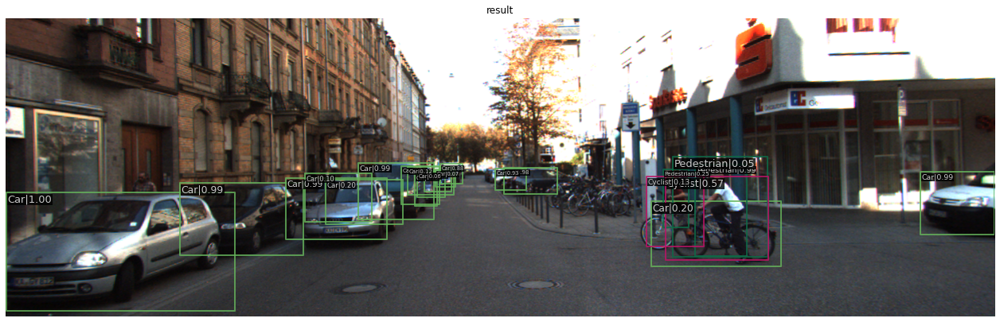

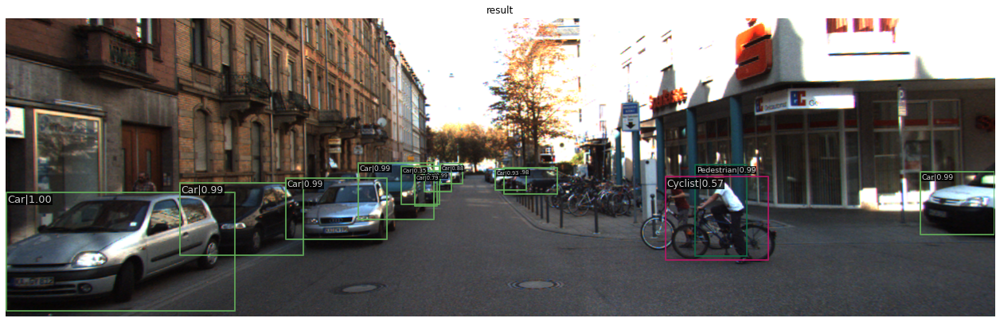

In [ ]:
show_result_pyplot(model, immg[100], result[100], score_thr=0.0)
show_result_pyplot(model, immg[100], result[100], score_thr=0.3)

load checkpoint from local path: checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth


/content/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


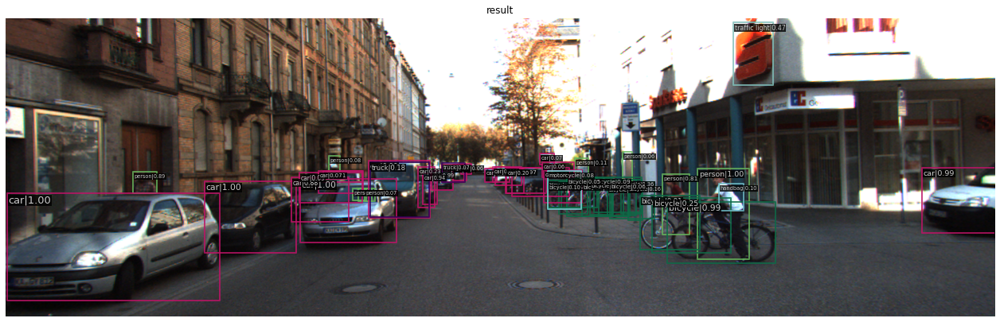

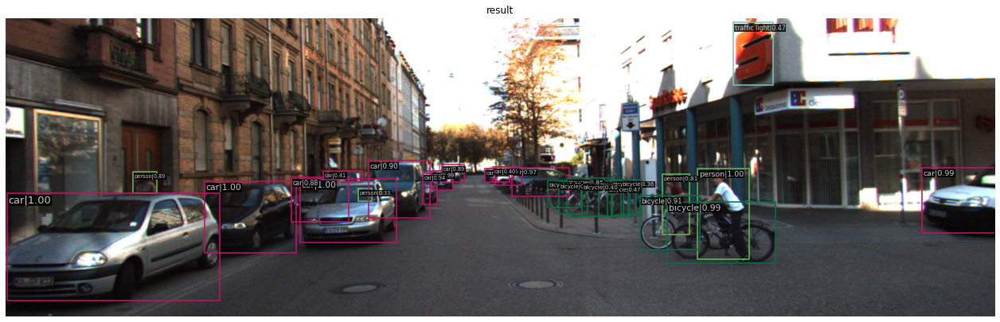

In [ ]:
config = 'configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco.py'
checkpoint = 'checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'
model = init_detector(config, checkpoint, device='cuda:0' )
result = []
[ result.append(inference_detector(model, x)) for x in immg ]
show_result_pyplot(model, immg[100], result[100], score_thr=0.0)
show_result_pyplot(model, immg[100], result[100], score_thr=0.3)

FASTER R-50-C4

In [ ]:
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

2022-05-23 23:01:21,655 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int` for which `np.compat.long` is itself an alias. Doing this will not modify any behaviour and is safe. When replacing `np.long`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:58: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by i

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 25/25, 0.8 task/s, elapsed: 32s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-05-23 23:13:38,101 - mmdet - INFO - 
+------------+-----+------+--------+-------+
| class      | gts | dets | recall | ap    |
+------------+-----+------+--------+-------+
| Car        | 62  | 311  | 0.968  | 0.827 |
| Pedestrian | 13  | 159  | 0.846  | 0.726 |
| Cyclist    | 7   | 102  | 0.571  | 0.218 |
| Truck      | 3   | 134  | 1.000  | 0.867 |
+------------+-----+------+--------+-------+
| mAP        |     |      |        | 0.660 |
+------------+-----+------+--------+-------+
2022-05-23 23:13:38,104 - mmdet - INFO - Epoch(val) [12][25]	AP50: 0.6600, mAP: 0.6596


In [ ]:
immg = []
[immg.append(mmcv.imread(img)) for img in imgs]

model.cfg = cfg

all_times = []
for x in immg:
  start_time = time.time()
  result = (inference_detector(model, x))
  #result_time = (time.time() - start_time)*1000
  result_time = (time.time() - start_time)
  all_times.append(result_time)

print(all_times)

/content/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


[1.2767529487609863, 1.231405258178711, 1.228078842163086, 1.2366573810577393, 1.2390244007110596, 1.240955114364624, 1.2494487762451172, 1.245570182800293, 1.2542307376861572, 1.2522993087768555, 1.2549896240234375, 1.2522096633911133, 1.262660264968872, 1.2641925811767578, 1.2694683074951172, 1.2688422203063965, 1.270826816558838, 1.280522108078003, 1.2791054248809814, 2.0214452743530273, 1.2827980518341064, 1.2868056297302246, 1.2968075275421143, 1.299245834350586, 1.2981789112091064, 1.3017551898956299, 1.294309377670288, 1.2986135482788086, 1.3007481098175049, 1.300415277481079, 1.291862964630127, 1.3013689517974854, 1.2859582901000977, 1.2896692752838135, 1.2812626361846924, 1.282440423965454, 1.2771220207214355, 1.2730011940002441, 1.2742376327514648, 1.2690010070800781, 1.2681787014007568, 1.2721781730651855, 1.267118215560913, 1.2652499675750732, 1.2626407146453857, 1.2595837116241455, 1.2596237659454346, 1.2518627643585205, 1.251570701599121, 1.251164197921753, 1.255315303802

In [ ]:
list_avg = np.mean(all_times) 
print(list_avg) 
print("Average value of the list with precision upto 3 decimal value:\n") 
print(round(list_avg,3))

1.2716530101134045
Average value of the list with precision upto 3 decimal value:

1.272


In [ ]:
list = all_times
print("List : " + str(list))

st_dev = np.std(list)

print("Standard deviation of the given list: " + str(round(st_dev,3))) # сколько в среднем отклоняеются +- стд

List : [1.2767529487609863, 1.231405258178711, 1.228078842163086, 1.2366573810577393, 1.2390244007110596, 1.240955114364624, 1.2494487762451172, 1.245570182800293, 1.2542307376861572, 1.2522993087768555, 1.2549896240234375, 1.2522096633911133, 1.262660264968872, 1.2641925811767578, 1.2694683074951172, 1.2688422203063965, 1.270826816558838, 1.280522108078003, 1.2791054248809814, 2.0214452743530273, 1.2827980518341064, 1.2868056297302246, 1.2968075275421143, 1.299245834350586, 1.2981789112091064, 1.3017551898956299, 1.294309377670288, 1.2986135482788086, 1.3007481098175049, 1.300415277481079, 1.291862964630127, 1.3013689517974854, 1.2859582901000977, 1.2896692752838135, 1.2812626361846924, 1.282440423965454, 1.2771220207214355, 1.2730011940002441, 1.2742376327514648, 1.2690010070800781, 1.2681787014007568, 1.2721781730651855, 1.267118215560913, 1.2652499675750732, 1.2626407146453857, 1.2595837116241455, 1.2596237659454346, 1.2518627643585205, 1.251570701599121, 1.251164197921753, 1.25531

In [ ]:
result = []
[ result.append(inference_detector(model, x)) for x in immg ];

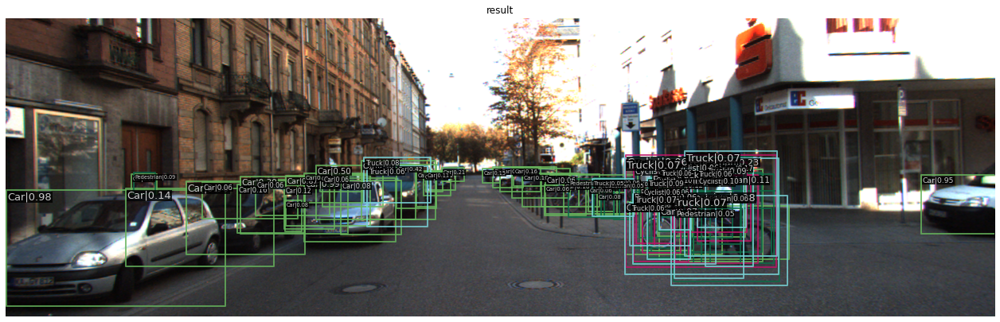

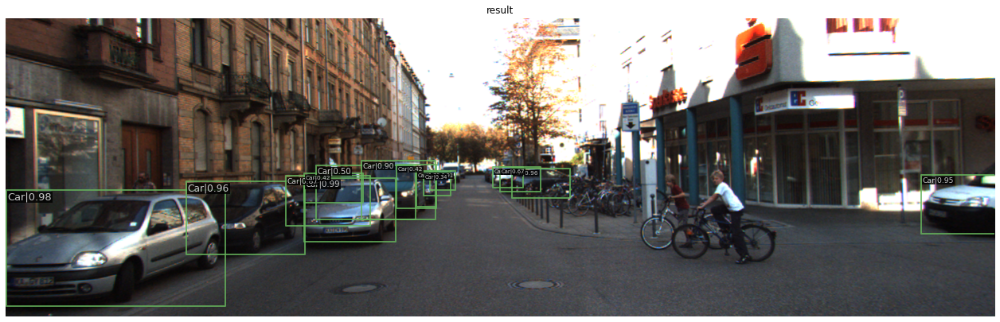

In [ ]:
show_result_pyplot(model, immg[100], result[100], score_thr=0.0)
show_result_pyplot(model, immg[100], result[100], score_thr=0.3)

load checkpoint from local path: checkpoints/faster_rcnn_r50_caffe_c4_1x_coco_20220316_150152-3f885b85.pth


/content/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


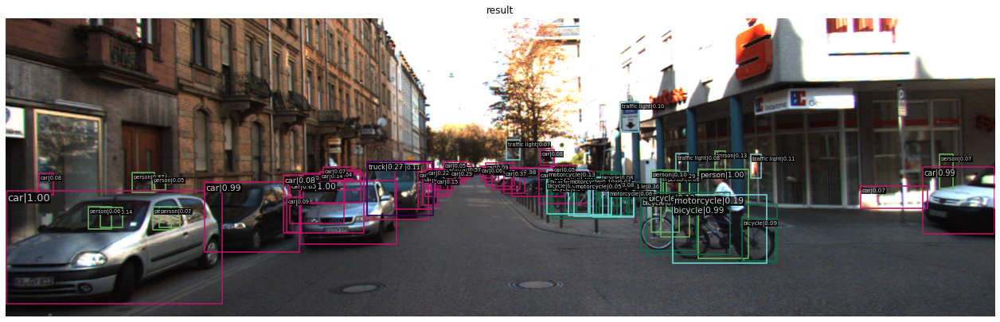

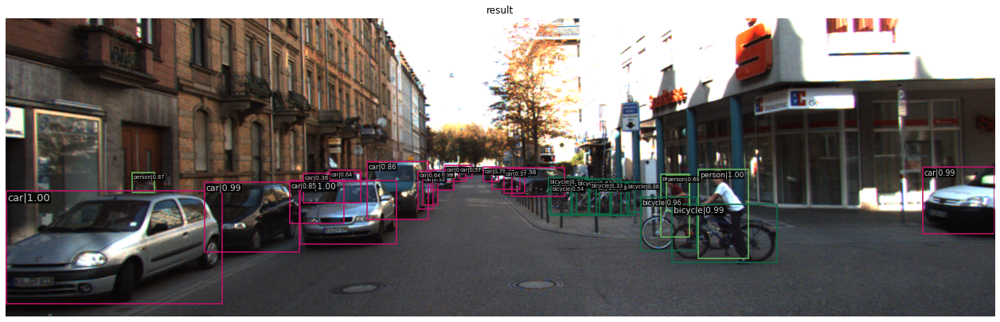

In [ ]:
config = ('configs/faster_rcnn/faster_rcnn_r50_caffe_c4_1x_coco.py')
# Setup a checkpoint file to load
checkpoint = 'checkpoints/faster_rcnn_r50_caffe_c4_1x_coco_20220316_150152-3f885b85.pth'
# initialize the detector
model = init_detector(config, checkpoint, device='cuda:0' )
result = []
[ result.append(inference_detector(model, x)) for x in immg ]
show_result_pyplot(model, immg[100], result[100], score_thr=0.0)
show_result_pyplot(model, immg[100], result[100], score_thr=0.3)

ssd_mobilenet

In [ ]:
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
2022-05-22 10:47:45,845 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int` for which `np.compat.long` is itself an alias. Doing this will not modify any behaviour and is safe. When replacing `np.long`, you may wish to use e.g. `n

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 25/25, 23.9 task/s, elapsed: 1s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-05-22 10:50:03,429 - mmdet - INFO - 
+------------+-----+------+--------+-------+
| class      | gts | dets | recall | ap    |
+------------+-----+------+--------+-------+
| Car        | 62  | 3543 | 0.726  | 0.411 |
| Pedestrian | 13  | 222  | 0.615  | 0.147 |
| Cyclist    | 7   | 102  | 0.000  | 0.000 |
| Truck      | 3   | 1133 | 0.000  | 0.000 |
+------------+-----+------+--------+-------+
| mAP        |     |      |        | 0.139 |
+------------+-----+------+--------+-------+
2022-05-22 10:50:03,431 - mmdet - INFO - Epoch(val) [12][25]	AP50: 0.1390, mAP: 0.1394
2022-05-22 10:50:14,077 - mmdet - INFO - Epoch [13][10/11]	lr: 8.253e-04, eta: 0:19:21, time: 1.062, data_time: 0.514, memory: 4350, loss_cls: 3.7878, loss_bbox: 0.9322, loss: 4.7201
2022-05-22 10:50:24,784 - mmdet - INFO - Epoch [14][10/11]	lr: 8.858e-04, eta: 0:19:05, time: 1.019, data_time: 0.509, memory: 4350, loss_cls: 3.6455, loss_bbox: 1.0309, loss: 4.6764
2022-05-22 10:50:36,310 - mmdet - INFO - Epoch [15][10/

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 25/25, 23.3 task/s, elapsed: 1s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-05-22 10:52:16,494 - mmdet - INFO - 
+------------+-----+------+--------+-------+
| class      | gts | dets | recall | ap    |
+------------+-----+------+--------+-------+
| Car        | 62  | 4657 | 0.806  | 0.505 |
| Pedestrian | 13  | 111  | 0.615  | 0.354 |
| Cyclist    | 7   | 32   | 0.000  | 0.000 |
| Truck      | 3   | 200  | 0.667  | 0.400 |
+------------+-----+------+--------+-------+
| mAP        |     |      |        | 0.315 |
+------------+-----+------+--------+-------+
2022-05-22 10:52:16,497 - mmdet - INFO - Epoch(val) [24][25]	AP50: 0.3150, mAP: 0.3147
2022-05-22 10:52:26,844 - mmdet - INFO - Epoch [25][10/11]	lr: 1.482e-03, eta: 0:16:49, time: 1.032, data_time: 0.525, memory: 4350, loss_cls: 2.2285, loss_bbox: 0.7686, loss: 2.9971
2022-05-22 10:52:37,591 - mmdet - INFO - Epoch [26][10/11]	lr: 1.528e-03, eta: 0:16:37, time: 1.024, data_time: 0.523, memory: 4350, loss_cls: 2.1432, loss_bbox: 0.7132, loss: 2.8565
2022-05-22 10:52:48,546 - mmdet - INFO - Epoch [27][10/

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 25/25, 23.5 task/s, elapsed: 1s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-05-22 10:54:28,130 - mmdet - INFO - 
+------------+-----+------+--------+-------+
| class      | gts | dets | recall | ap    |
+------------+-----+------+--------+-------+
| Car        | 62  | 4555 | 0.758  | 0.426 |
| Pedestrian | 13  | 225  | 0.615  | 0.208 |
| Cyclist    | 7   | 60   | 0.000  | 0.000 |
| Truck      | 3   | 160  | 0.333  | 0.333 |
+------------+-----+------+--------+-------+
| mAP        |     |      |        | 0.242 |
+------------+-----+------+--------+-------+
2022-05-22 10:54:28,135 - mmdet - INFO - Epoch(val) [36][25]	AP50: 0.2420, mAP: 0.2419
2022-05-22 10:54:38,236 - mmdet - INFO - Epoch [37][10/11]	lr: 1.929e-03, eta: 0:14:33, time: 1.007, data_time: 0.484, memory: 4350, loss_cls: 1.7765, loss_bbox: 0.7722, loss: 2.5486
2022-05-22 10:54:48,986 - mmdet - INFO - Epoch [38][10/11]	lr: 1.955e-03, eta: 0:14:22, time: 1.024, data_time: 0.503, memory: 4350, loss_cls: 1.7682, loss_bbox: 0.8272, loss: 2.5954
2022-05-22 10:54:59,422 - mmdet - INFO - Epoch [39][10/

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 25/25, 24.1 task/s, elapsed: 1s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-05-22 10:56:37,641 - mmdet - INFO - 
+------------+-----+------+--------+-------+
| class      | gts | dets | recall | ap    |
+------------+-----+------+--------+-------+
| Car        | 62  | 3045 | 0.790  | 0.480 |
| Pedestrian | 13  | 612  | 0.615  | 0.307 |
| Cyclist    | 7   | 343  | 0.000  | 0.000 |
| Truck      | 3   | 1000 | 0.667  | 0.400 |
+------------+-----+------+--------+-------+
| mAP        |     |      |        | 0.297 |
+------------+-----+------+--------+-------+
2022-05-22 10:56:37,644 - mmdet - INFO - Epoch(val) [48][25]	AP50: 0.2970, mAP: 0.2968
2022-05-22 10:56:47,838 - mmdet - INFO - Epoch [49][10/11]	lr: 1.964e-03, eta: 0:12:20, time: 1.017, data_time: 0.508, memory: 4350, loss_cls: 1.5071, loss_bbox: 0.6167, loss: 2.1238
2022-05-22 10:56:58,352 - mmdet - INFO - Epoch [50][10/11]	lr: 1.926e-03, eta: 0:12:09, time: 1.001, data_time: 0.516, memory: 4350, loss_cls: 1.5377, loss_bbox: 0.6802, loss: 2.2179
2022-05-22 10:57:08,899 - mmdet - INFO - Epoch [51][10/

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 25/25, 23.9 task/s, elapsed: 1s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-05-22 10:58:45,691 - mmdet - INFO - 
+------------+-----+------+--------+-------+
| class      | gts | dets | recall | ap    |
+------------+-----+------+--------+-------+
| Car        | 62  | 3134 | 0.774  | 0.570 |
| Pedestrian | 13  | 764  | 0.615  | 0.055 |
| Cyclist    | 7   | 378  | 0.000  | 0.000 |
| Truck      | 3   | 495  | 0.333  | 0.022 |
+------------+-----+------+--------+-------+
| mAP        |     |      |        | 0.162 |
+------------+-----+------+--------+-------+
2022-05-22 10:58:45,694 - mmdet - INFO - Epoch(val) [60][25]	AP50: 0.1620, mAP: 0.1618
2022-05-22 10:58:55,818 - mmdet - INFO - Epoch [61][10/11]	lr: 1.500e-03, eta: 0:10:11, time: 1.010, data_time: 0.489, memory: 4350, loss_cls: 1.3253, loss_bbox: 0.6486, loss: 1.9739
2022-05-22 10:59:06,470 - mmdet - INFO - Epoch [62][10/11]	lr: 1.461e-03, eta: 0:10:00, time: 1.015, data_time: 0.508, memory: 4350, loss_cls: 1.3561, loss_bbox: 0.6215, loss: 1.9776
2022-05-22 10:59:16,928 - mmdet - INFO - Epoch [63][10/

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 25/25, 23.8 task/s, elapsed: 1s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-05-22 11:00:53,186 - mmdet - INFO - 
+------------+-----+------+--------+-------+
| class      | gts | dets | recall | ap    |
+------------+-----+------+--------+-------+
| Car        | 62  | 1524 | 0.823  | 0.557 |
| Pedestrian | 13  | 566  | 0.615  | 0.102 |
| Cyclist    | 7   | 453  | 0.000  | 0.000 |
| Truck      | 3   | 515  | 0.333  | 0.333 |
+------------+-----+------+--------+-------+
| mAP        |     |      |        | 0.248 |
+------------+-----+------+--------+-------+
2022-05-22 11:00:53,189 - mmdet - INFO - Epoch(val) [72][25]	AP50: 0.2480, mAP: 0.2480
2022-05-22 11:01:03,410 - mmdet - INFO - Epoch [73][10/11]	lr: 1.036e-03, eta: 0:08:04, time: 1.019, data_time: 0.523, memory: 4350, loss_cls: 1.2192, loss_bbox: 0.5526, loss: 1.7718
2022-05-22 11:01:13,807 - mmdet - INFO - Epoch [74][10/11]	lr: 9.993e-04, eta: 0:07:53, time: 0.986, data_time: 0.514, memory: 4350, loss_cls: 1.1237, loss_bbox: 0.4492, loss: 1.5729
2022-05-22 11:01:24,548 - mmdet - INFO - Epoch [75][10/

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 25/25, 23.6 task/s, elapsed: 1s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-05-22 11:03:01,505 - mmdet - INFO - 
+------------+-----+------+--------+-------+
| class      | gts | dets | recall | ap    |
+------------+-----+------+--------+-------+
| Car        | 62  | 884  | 0.790  | 0.522 |
| Pedestrian | 13  | 302  | 0.692  | 0.131 |
| Cyclist    | 7   | 201  | 0.000  | 0.000 |
| Truck      | 3   | 216  | 0.333  | 0.333 |
+------------+-----+------+--------+-------+
| mAP        |     |      |        | 0.246 |
+------------+-----+------+--------+-------+
2022-05-22 11:03:01,508 - mmdet - INFO - Epoch(val) [84][25]	AP50: 0.2460, mAP: 0.2465
2022-05-22 11:03:11,342 - mmdet - INFO - Epoch [85][10/11]	lr: 6.183e-04, eta: 0:05:59, time: 0.980, data_time: 0.499, memory: 4350, loss_cls: 0.9419, loss_bbox: 0.4074, loss: 1.3493
2022-05-22 11:03:21,614 - mmdet - INFO - Epoch [86][10/11]	lr: 5.869e-04, eta: 0:05:48, time: 0.974, data_time: 0.481, memory: 4350, loss_cls: 1.0267, loss_bbox: 0.4324, loss: 1.4592
2022-05-22 11:03:32,188 - mmdet - INFO - Epoch [87][10/

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 25/25, 24.0 task/s, elapsed: 1s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-05-22 11:05:10,425 - mmdet - INFO - 
+------------+-----+------+--------+-------+
| class      | gts | dets | recall | ap    |
+------------+-----+------+--------+-------+
| Car        | 62  | 679  | 0.790  | 0.557 |
| Pedestrian | 13  | 234  | 0.385  | 0.032 |
| Cyclist    | 7   | 113  | 0.000  | 0.000 |
| Truck      | 3   | 145  | 0.333  | 0.333 |
+------------+-----+------+--------+-------+
| mAP        |     |      |        | 0.231 |
+------------+-----+------+--------+-------+
2022-05-22 11:05:10,428 - mmdet - INFO - Epoch(val) [96][25]	AP50: 0.2310, mAP: 0.2307
2022-05-22 11:05:20,453 - mmdet - INFO - Epoch [97][10/11]	lr: 2.865e-04, eta: 0:03:56, time: 1.000, data_time: 0.510, memory: 4350, loss_cls: 0.9757, loss_bbox: 0.4078, loss: 1.3836
2022-05-22 11:05:31,068 - mmdet - INFO - Epoch [98][10/11]	lr: 2.638e-04, eta: 0:03:45, time: 1.007, data_time: 0.501, memory: 4350, loss_cls: 0.9178, loss_bbox: 0.3883, loss: 1.3061
2022-05-22 11:05:41,722 - mmdet - INFO - Epoch [99][10/

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 25/25, 23.5 task/s, elapsed: 1s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-05-22 11:07:18,351 - mmdet - INFO - 
+------------+-----+------+--------+-------+
| class      | gts | dets | recall | ap    |
+------------+-----+------+--------+-------+
| Car        | 62  | 594  | 0.726  | 0.511 |
| Pedestrian | 13  | 209  | 0.385  | 0.047 |
| Cyclist    | 7   | 114  | 0.000  | 0.000 |
| Truck      | 3   | 125  | 0.333  | 0.333 |
+------------+-----+------+--------+-------+
| mAP        |     |      |        | 0.223 |
+------------+-----+------+--------+-------+
2022-05-22 11:07:18,354 - mmdet - INFO - Epoch(val) [108][25]	AP50: 0.2230, mAP: 0.2228
2022-05-22 11:07:28,568 - mmdet - INFO - Epoch [109][10/11]	lr: 7.342e-05, eta: 0:01:53, time: 1.018, data_time: 0.539, memory: 4350, loss_cls: 0.9412, loss_bbox: 0.3518, loss: 1.2930
2022-05-22 11:07:39,264 - mmdet - INFO - Epoch [110][10/11]	lr: 6.177e-05, eta: 0:01:42, time: 1.018, data_time: 0.504, memory: 4350, loss_cls: 0.9797, loss_bbox: 0.4343, loss: 1.4141
2022-05-22 11:07:49,783 - mmdet - INFO - Epoch [111]

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 25/25, 23.9 task/s, elapsed: 1s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-05-22 11:09:25,878 - mmdet - INFO - 
+------------+-----+------+--------+-------+
| class      | gts | dets | recall | ap    |
+------------+-----+------+--------+-------+
| Car        | 62  | 643  | 0.726  | 0.516 |
| Pedestrian | 13  | 216  | 0.385  | 0.045 |
| Cyclist    | 7   | 128  | 0.000  | 0.000 |
| Truck      | 3   | 148  | 0.333  | 0.333 |
+------------+-----+------+--------+-------+
| mAP        |     |      |        | 0.224 |
+------------+-----+------+--------+-------+
2022-05-22 11:09:25,882 - mmdet - INFO - Epoch(val) [120][25]	AP50: 0.2240, mAP: 0.2236


In [ ]:
img = mmcv.imread('kitti_tiny/000970.png')

model.cfg = cfg
result = inference_detector(model, img)
result

/content/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


[array([[3.6087982e+02, 1.9093678e+02, 4.9373526e+02, 2.6786124e+02,
         9.9677485e-01],
        [7.4488678e+02, 1.5996878e+02, 8.5398749e+02, 2.0477849e+02,
         7.3590827e-01],
        [1.9088266e+02, 1.9833592e+02, 3.8335681e+02, 2.8852368e+02,
         7.0192188e-01],
        [6.2576752e+02, 1.7345070e+02, 6.7592517e+02, 2.1122571e+02,
         6.1165136e-01],
        [4.7671295e+02, 1.8358342e+02, 5.2072864e+02, 2.1576620e+02,
         1.6792305e-01],
        [2.2344165e+00, 2.3205154e+02, 2.3373007e+02, 3.3243005e+02,
         1.0579384e-01],
        [2.6312930e+02, 2.0029170e+02, 4.0388202e+02, 2.6725293e+02,
         8.9346133e-02],
        [5.0409525e+02, 1.8027165e+02, 5.3636145e+02, 2.0357765e+02,
         8.6605147e-02],
        [5.8653802e+02, 1.7648083e+02, 6.0957239e+02, 1.9858521e+02,
         8.0195904e-02],
        [4.3377795e+02, 1.8598289e+02, 5.1790356e+02, 2.3357141e+02,
         6.9391027e-02],
        [4.1574054e+02, 1.8494395e+02, 4.8210934e+02, 2.1741

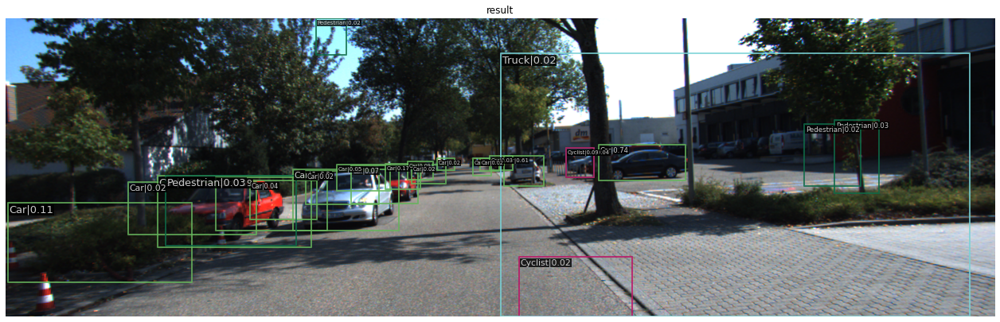

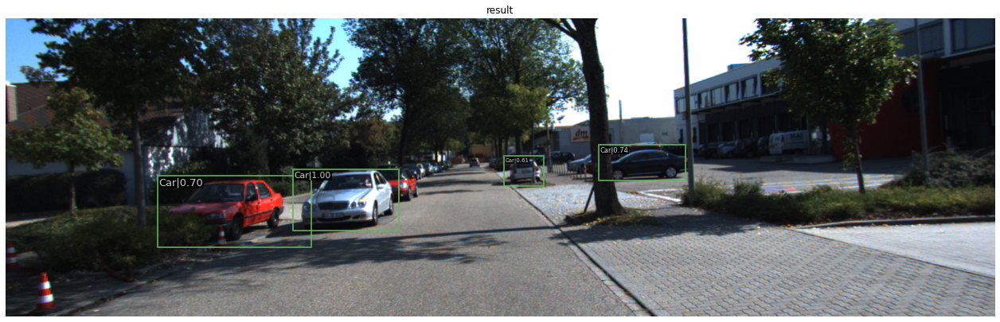

In [ ]:
show_result_pyplot(model, img, result, score_thr=0.0)
show_result_pyplot(model, img, result, score_thr=0.3)

In [ ]:
config = ('configs/ssd/ssdlite_mobilenetv2_scratch_600e_coco.py')
# Setup a checkpoint file to load
checkpoint = 'checkpoints/ssdlite_mobilenetv2_scratch_600e_coco_20210629_110627-974d9307.pth'
# initialize the detector
model = init_detector(config, checkpoint, device='cuda:0' )
# Use the detector to do inference
img = mmcv.imread('kitti_tiny/000970.png')
result = inference_detector(model, img)
result

load checkpoint from local path: checkpoints/ssdlite_mobilenetv2_scratch_600e_coco_20210629_110627-974d9307.pth


/content/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


[array([[6.89298828e+02, 1.66051483e+02, 7.19441895e+02, 1.98224716e+02,
         2.45309085e-01],
        [6.30469482e+02, 1.73791840e+02, 6.59839844e+02, 2.03420837e+02,
         2.18832254e-01],
        [4.85522247e+02, 1.81224380e+02, 5.31932983e+02, 2.34278259e+02,
         1.13800205e-01],
        [5.65694641e+02, 1.71941696e+02, 5.87099915e+02, 1.93811539e+02,
         9.63527486e-02],
        [6.99353088e+02, 1.68015747e+02, 7.32387085e+02, 2.08561447e+02,
         9.51310024e-02],
        [5.74528137e+02, 1.78581833e+02, 6.00015076e+02, 2.02725540e+02,
         8.69654194e-02],
        [4.82072210e+00, 2.62285797e+02, 6.93244095e+01, 3.66319611e+02,
         7.98073858e-02],
        [6.18266663e+02, 1.56353012e+02, 6.81415283e+02, 2.09993973e+02,
         6.78031668e-02],
        [6.91633423e+02, 1.14796532e+02, 9.16048279e+02, 2.82781555e+02,
         6.70164153e-02],
        [4.99321564e+02, 1.72646423e+02, 5.40274414e+02, 2.15584625e+02,
         6.62593395e-02],
        [8

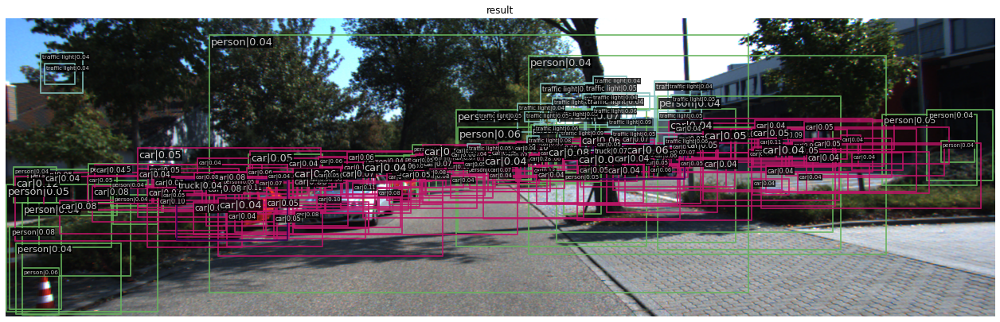

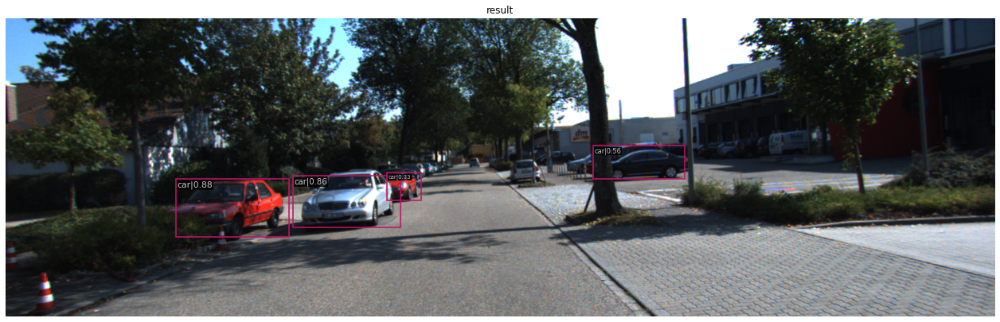

In [ ]:
show_result_pyplot(model, img, result, score_thr=0.0)
show_result_pyplot(model, img, result, score_thr=0.3)